## Detections with Mobilenet 

In [1]:
from keras import backend as K
from keras.models import load_model
from keras.preprocessing import image
from keras.optimizers import Adam
from imageio import imread
import numpy as np
import matplotlib.patches as patches
from matplotlib import pyplot as plt

from keras_loss_function.keras_ssd_loss import SSDLoss
from keras_layers.keras_layer_AnchorBoxes import AnchorBoxes
from keras_layers.keras_layer_DecodeDetections import DecodeDetections
from keras_layers.keras_layer_DecodeDetectionsFast import DecodeDetectionsFast
from keras_layers.keras_layer_L2Normalization import L2Normalization

from ssd_encoder_decoder.ssd_output_decoder import decode_detections, decode_detections_fast

from data_generator.object_detection_2d_data_generator import DataGenerator
from data_generator.object_detection_2d_photometric_ops import ConvertTo3Channels
from data_generator.object_detection_2d_geometric_ops import Resize
from data_generator.object_detection_2d_misc_utils import apply_inverse_transforms

from extra_files import helper

%matplotlib inline

Using TensorFlow backend.
/home/aldo/Documents/ssd/data_generator/object_detection_2d_data_generator.py:43: UserWarning: 'BeautifulSoup' module is missing. The XML-parser will be unavailable.
  warnings.warn("'BeautifulSoup' module is missing. The XML-parser will be unavailable.")


In [3]:
def load_model_ssd300(path_model, 
                      size_model, 
                      num_classes, 
                      confidence, 
                      scales,
                      swap_channels,
                      mean_color,
                      divide_by_stddev,
                      steps,
                      iou,
                      alpha, 
                      expansion):
    '''
    Load model
    path_model: the path to the weights' model
    size_model: input size to the model
    num_classes: number of classes
    confidence: confidence use for nms
    scales: scales of default bounding boxes
    swap_channels: swap channels from input image
    mean_color: mean to rest from input image
    divide_by_stddev: number to divide input image
    steps: separations from each default box
    iou: iou use for nms
    alpha: controls the width of the network
    expansion: expansion on the inverted residual block from conv 13 on mobilenetv2
    '''
    
    # 1: Build the Keras model
    K.clear_session() # Clear previous models from memory.
    
    model = ssd_300(image_size=(size_model, size_model, 3),
                    n_classes=num_classes,
                    alpha = alpha,
                    expansion= expansion,
                    mode='inference',
                    scales=scales,
                    aspect_ratios_per_layer=[[1.0, 0.5, 2.0/3.0],
                                             [1.0, 0.5, 2.0/3.0, 1.0/3.0, 3.0/4.0],
                                             [1.0, 2.0, 0.5, 2.0/3.0, 1.0/3.0],
                                             [1.0, 2.0, 0.5, 2.0/3.0, 1.0/3.0],
                                             [1.0, 2.0, 0.5],
                                             [1.0, 2.0, 0.5]],
                    two_boxes_for_ar1=True,
                    steps=steps,
                    offsets=[0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
                    clip_boxes=False,
                    variances=[0.1, 0.1, 0.2, 0.2],
                    normalize_coords=True,
                    subtract_mean=mean_color,
                    divide_by_stddev=divide_by_stddev,
                    swap_channels=swap_channels,
                    confidence_thresh=confidence,
                    iou_threshold=iou,
                    top_k=200,
                    nms_max_output_size=400)

    # 2: Load the trained weights into the model.
    # TODO: Set the path of the trained weights.
    model.load_weights(path_model, by_name=True)

    # 3: Compile the model so that Keras won't complain the next time you load it.

    adam = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0)

    ssd_loss = SSDLoss(neg_pos_ratio=3, alpha=1.0)

    model.compile(optimizer=adam, loss=ssd_loss.compute_loss)
    
    return model

In [14]:
def get_prediction(model, 
                   image):
    '''
    Load model
    model:keras model
    image:numpy array with shape (1, 320, 320, 3)
    return detections
    '''
    
    # Create variable to store predictions
    predictions = np.zeros(shape=(1, 200, 6))
    
    pred = model.predict(image)
    predictions = np.append(predictions, pred, axis=0)
    predictions = predictions[1:] # delete empty item

    clean_pre = helper.clean_predictions(predictions, id_class)
    adjust_pre = helper.adjust_predictions(clean_pre) 
    results = helper.get_coordinates(adjust_pre) 
    return results

In [23]:
# Make predictions of the models
from models.keras_ssdlite320_mobilenetv2 import ssd_300

path_model = '../weights/models/tradeoff/ssdlite320_mobilenetv2_pascal_cic_1.0_exp_1.h5'
batch_size = 32
size_model = 320
num_classes = 1
scales = [0.15, 0.33, 0.47, 0.61, 0.76, 0.90, 1.05]
swap_channels = False
mean_color = [-1., -1., -1.]
id_class = 1
confidence = 0.20
divide_by_stddev = [127.5, 127.5, 127.5]
steps = [16, 32, 64, 107, 160, 320]
iou = 0.45
alpha = 1.0
expansion = 1

model = load_model_ssd300(path_model, 
                              size_model, 
                              num_classes, 
                              confidence, 
                              scales,
                              swap_channels,
                              mean_color,
                              divide_by_stddev,
                              steps,
                              iou,
                              alpha,
                              expansion)

In [38]:
import os
# Get all image names
img_names = os.listdir('../data-cic/preprocess_data/img_test/')

/home/aldo/anaconda3/envs/test2/lib/python3.6/site-packages/ipykernel_launcher.py:6: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  
/home/aldo/anaconda3/envs/test2/lib/python3.6/site-packages/ipykernel_launcher.py:7: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
  import sys


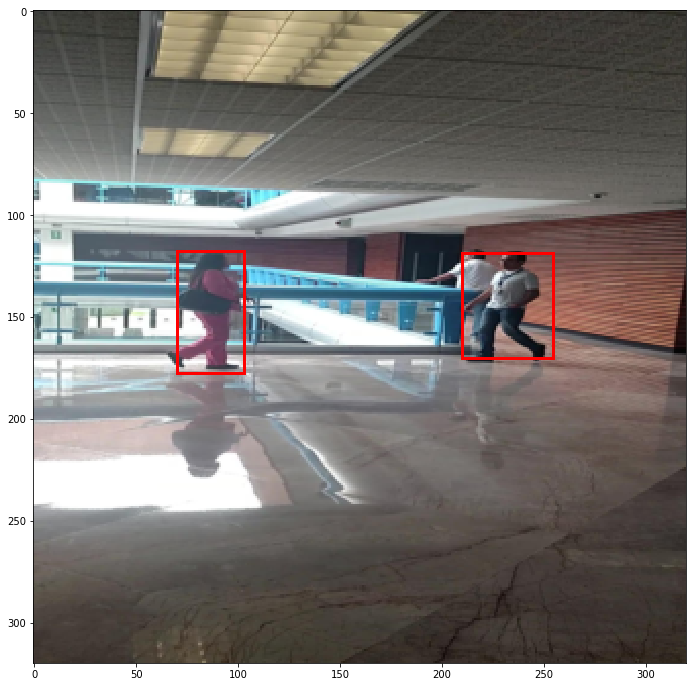

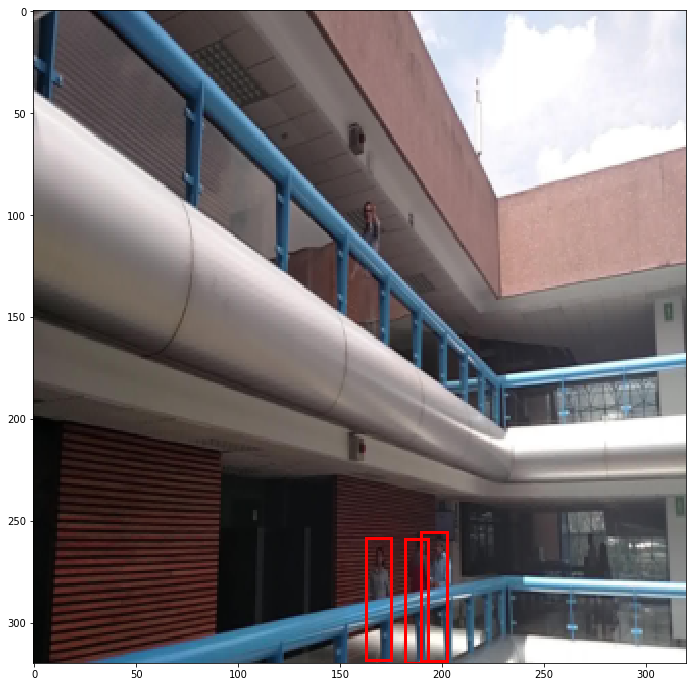

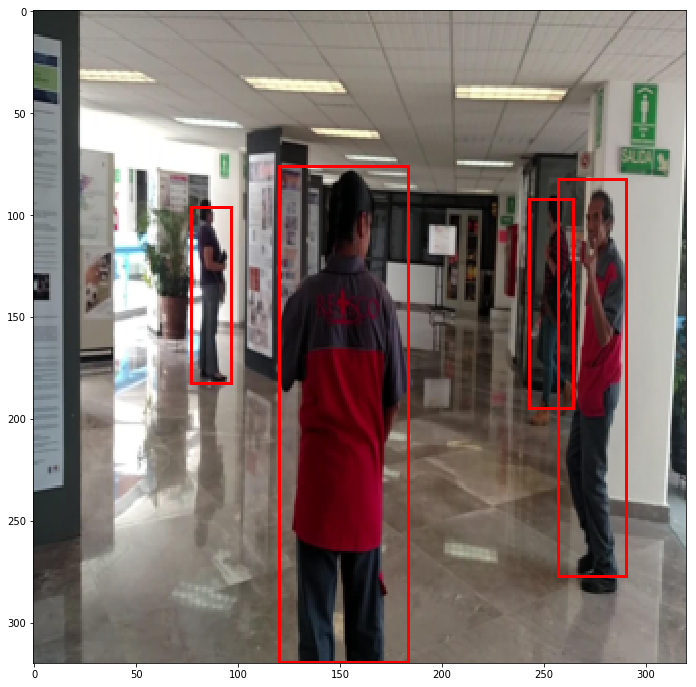

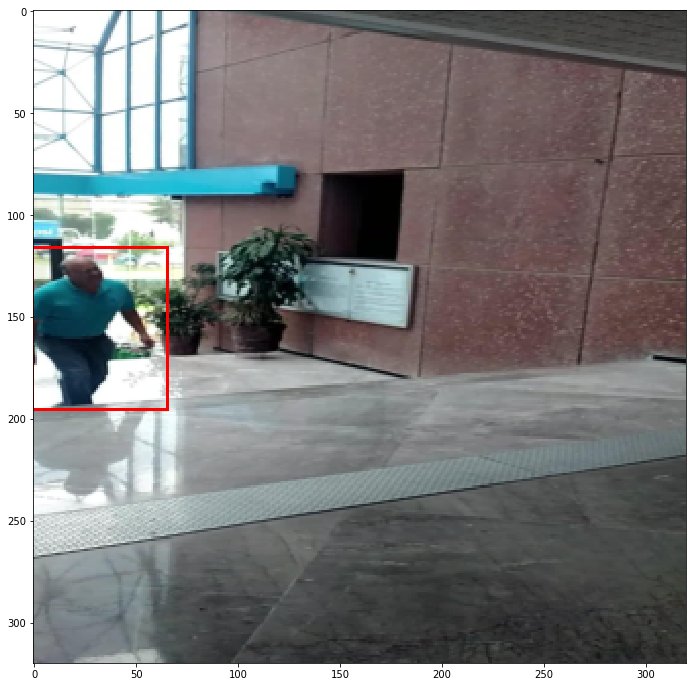

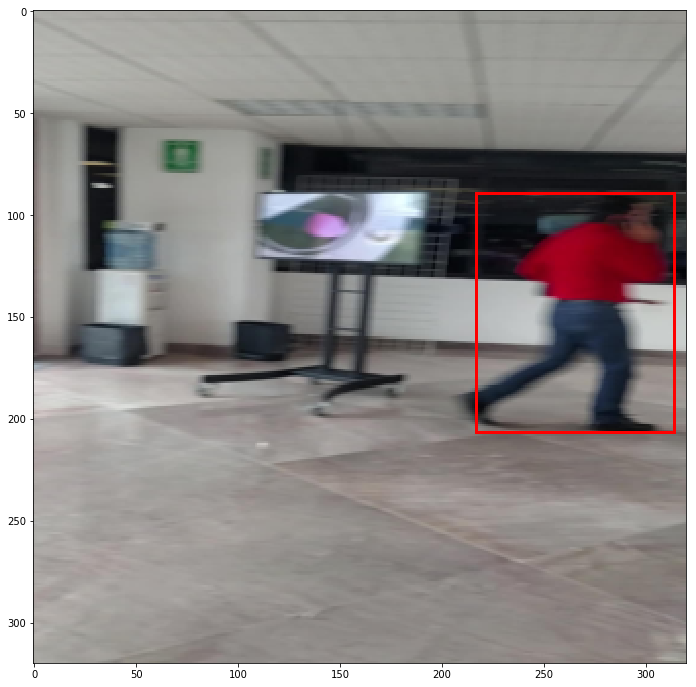

...

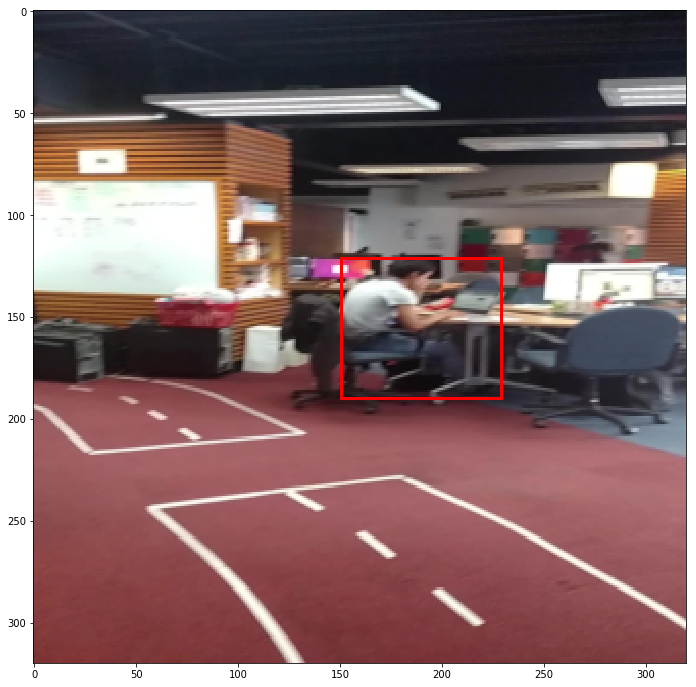

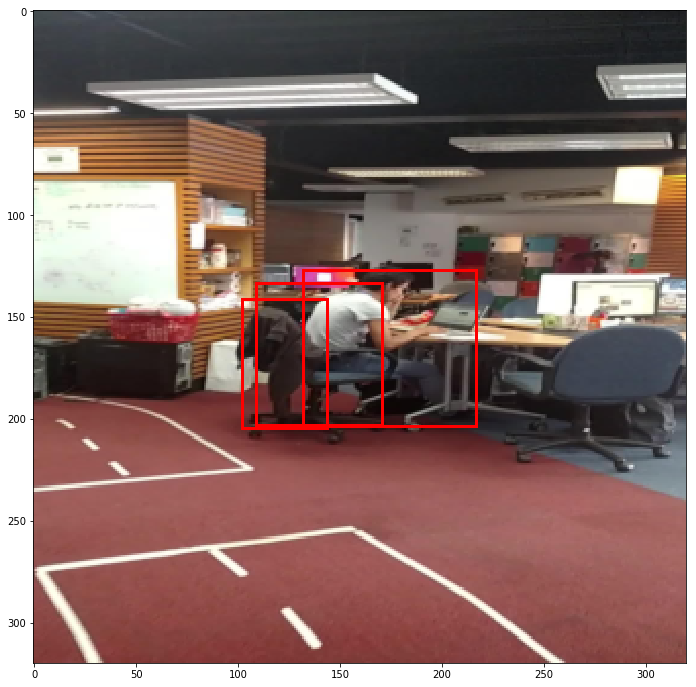

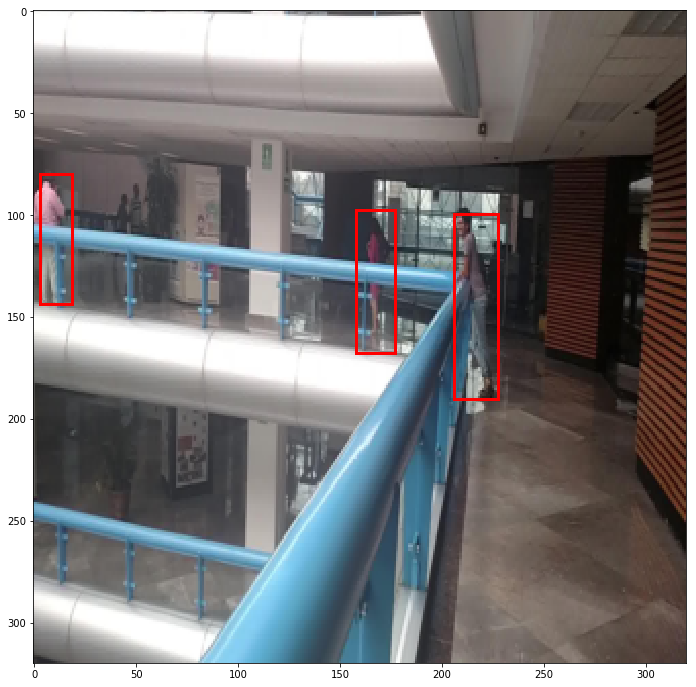

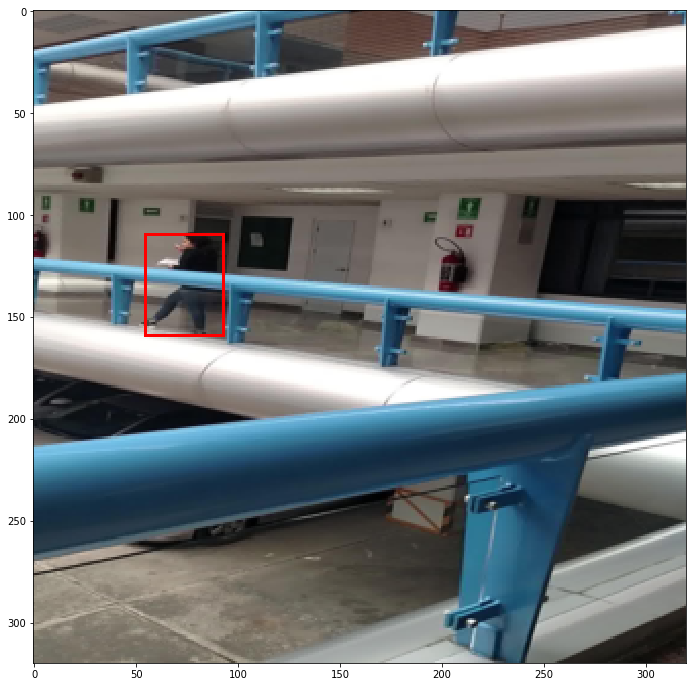

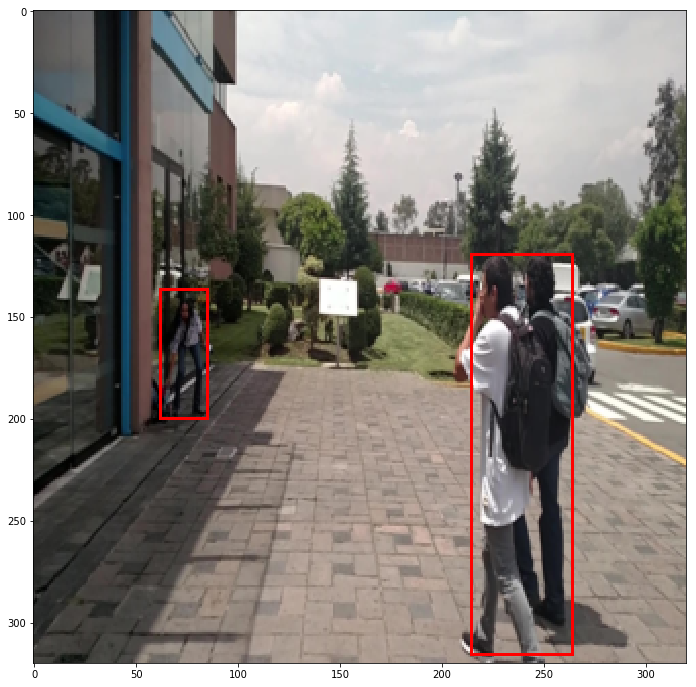

In [40]:
from scipy import misc
import matplotlib.pyplot as plt

for name_img in img_names:
    # Read image
    image_test = misc.imread('../data-cic/preprocess_data/img_test/' + name_img)
    image_test = misc.imresize(image_test, size=(320,320))
    image_test = image_test.reshape(1, 320, 320, 3)

    predictions = get_prediction(model, image_test)
    image_test = image_test.reshape(320, 320, 3)
    helper.show_image_bb(image_test, predictions[0])